In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [6]:
# Root directory for dataset
dataroot = "celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

device = torch.device("cpu")

torch.Size([3, 530, 530])


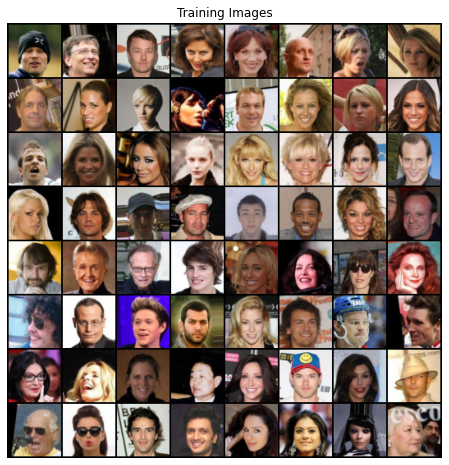

In [7]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
grd = vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu()
print(grd.shape)
plt.imshow(np.transpose(grd,(1,2,0)))

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    if classname.find("BatchNorm") != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)


In [9]:
ngpu = 0

In [11]:
real_batch[0][0].shape

torch.Size([3, 64, 64])

In [6]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*8,ngf*4,4,2,1,bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*4,ngf*2,4,2,1,bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf*2,ngf,4,2,1,bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            nn.ConvTranspose2d(ngf,nc,4,2,1,bias=False),
            nn.Tanh()
        )

    def forward(self, input):
        return self.main(input)


In [7]:
netG = Generator().to(device)

netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator,self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(nc,ndf,4,2,1,bias=False),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(ndf*1,ndf*2,4,2,1,bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace= True),

            nn.Conv2d(ndf*2,ndf*4,4,2,1,bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace= True),

            nn.Conv2d(ndf*4,ndf*8,4,2,1,bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace= True),

            nn.Conv2d(ndf*8,1,4,1,0,bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
netD = Discriminator().to(device)
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [10]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64,nz,1,1,device=device)

real_label = 1
fake_label = 0

real_labels = torch.full((batch_size,),real_label,dtype=torch.float,device=device)
fake_labels = torch.full((batch_size,),fake_label,dtype=torch.float,device=device)

optimizerD = torch.optim.Adam(netD.parameters(), lr=lr, betas=(beta1,0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=lr, betas=(beta1,0.999))



In [11]:
img_list = []
D_losses = []
G_losses = []
iters = 0

for epoch in range(num_epochs):

    for i,data in enumerate(dataloader, 0):
        netD.zero_grad()

        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)


        if batch_size == b_size:
            labels = real_labels
        else:
            labels = torch.full((b_size,),real_label,dtype=torch.float,device=device)

        output = netD(real_cpu).view(-1)
        #print(f"batch_size: {batch_size},  b_size: {b_size}, output shape: {output.shape}")
        loss_real = criterion(output,labels)
        loss_real.backward()
        D_x = output.mean().item()

        if batch_size == b_size:
            labels = fake_labels
        else:
            labels.fill_(fake_label)

        noise = torch.randn((b_size,nz,1,1),device=device)
        fakes = netG(noise)
        fake_out = netD(fakes.detach()).view(-1)
        loss_fake = criterion(fake_out,labels)
        loss_fake.backward()
        D_G_z1 = output.mean().item()
        lossD = loss_fake + loss_real

        optimizerD.step()

        # OPTIMIZE Generator

        netG.zero_grad()
        outD = netD(fakes).view(-1)
        if batch_size == b_size:
            labels = real_labels
        else:
            labels.fill_(real_label)

        lossG = criterion(outD,labels)
        D_G_z2 = outD.mean().item()
        lossG.backward()

        optimizerG.step()

        if i%10 == 0:
            print(f"epoch: {epoch}/{num_epochs}, iter: {i}/{len(dataloader)},\nlossD_fake: {loss_fake.item()}, lossD_real: {loss_real.item()} lossG: {lossG.item()},\nD(x): {D_x}, D(G(z)): {D_G_z1}/{D_G_z2}")
            G_losses.append(lossG.item())
            D_losses.append(lossD.item())

            if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                with torch.no_grad():
                    fake = netG(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

epoch: 0/5, iter: 0/1583,
lossD_fake: 1.0509730577468872, lossD_real: 0.672692596912384 lossG: 5.257463455200195,
D(x): 0.5539104342460632, D(G(z)): 0.5539104342460632/0.5539104342460632
epoch: 0/5, iter: 10/1583,
lossD_fake: 0.1638728231191635, lossD_real: 0.12407822906970978 lossG: 9.283418655395508,
D(x): 0.9273946285247803, D(G(z)): 0.9273946285247803/0.9273946285247803
epoch: 0/5, iter: 20/1583,
lossD_fake: 1.2321469284870545e-06, lossD_real: 0.1975974291563034 lossG: 17.598045349121094,
D(x): 0.8915054798126221, D(G(z)): 0.8915054798126221/0.8915054798126221
epoch: 0/5, iter: 30/1583,
lossD_fake: 2.0851635932922363, lossD_real: 0.028682544827461243 lossG: 24.425155639648438,
D(x): 0.9753971099853516, D(G(z)): 0.9753971099853516/0.9753971099853516
epoch: 0/5, iter: 40/1583,
lossD_fake: 1.849490035965573e-05, lossD_real: 0.10517788678407669 lossG: 12.645139694213867,
D(x): 0.9320366382598877, D(G(z)): 0.9320366382598877/0.9320366382598877
epoch: 0/5, iter: 50/1583,
lossD_fake: 0.08

KeyboardInterrupt: 

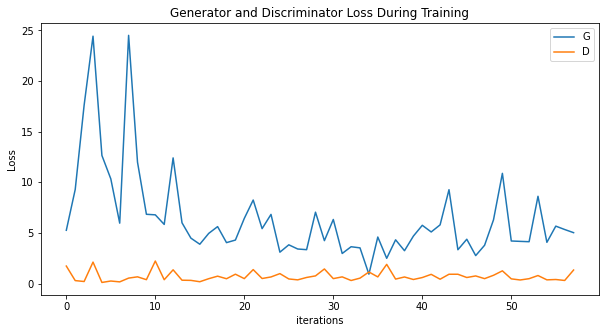

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

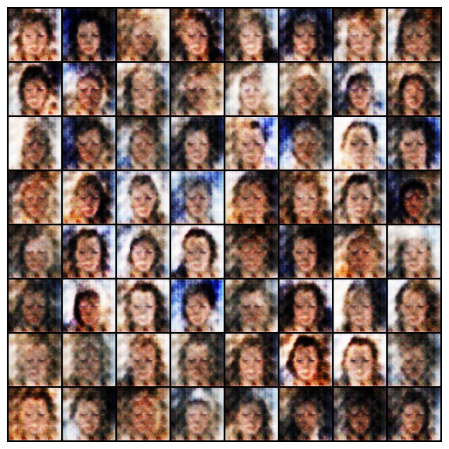

In [13]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [14]:
for epoch in range(num_epochs):

    for i,data in enumerate(dataloader, 0):
        if(i<600):
            iters+=1
        else:
            netD.zero_grad()

            real_cpu = data[0].to(device)
            b_size = real_cpu.size(0)


            if batch_size == b_size:
                labels = real_labels
            else:
                labels = torch.full((b_size,),real_label,dtype=torch.float,device=device)

            output = netD(real_cpu).view(-1)
            #print(f"batch_size: {batch_size},  b_size: {b_size}, output shape: {output.shape}")
            loss_real = criterion(output,labels)
            loss_real.backward()
            D_x = output.mean().item()

            if batch_size == b_size:
                labels = fake_labels
            else:
                labels.fill_(fake_label)

            noise = torch.randn((b_size,nz,1,1),device=device)
            fakes = netG(noise)
            fake_out = netD(fakes.detach()).view(-1)
            loss_fake = criterion(fake_out,labels)
            loss_fake.backward()
            D_G_z1 = output.mean().item()
            lossD = loss_fake + loss_real

            optimizerD.step()

            # OPTIMIZE Generator

            netG.zero_grad()
            outD = netD(fakes).view(-1)
            if batch_size == b_size:
                labels = real_labels
            else:
                labels.fill_(real_label)

            lossG = criterion(outD,labels)
            lossG.backward()

            D_G_z2 = output.mean().item()

            optimizerG.step()

            if i%10 == 0:
                print(f"epoch: {epoch}/{num_epochs}, iter: {i}/{len(dataloader)},\nlossD_fake: {loss_fake.item()}, lossD_real: {loss_real.item()} lossG: {lossG.item()},\nD(x): {D_x}, D(G(z)): {D_G_z1}/{D_G_z2}")
                G_losses.append(lossG.item())
                D_losses.append(lossD.item())

                if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
                    with torch.no_grad():
                        fake = netG(fixed_noise).detach().cpu()
                    img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            iters += 1

epoch: 0/5, iter: 600/1583,
lossD_fake: 0.003831001929938793, lossD_real: 0.5437897443771362 lossG: 3.4633421897888184,
D(x): 0.6728125214576721, D(G(z)): 0.6728125214576721/0.6728125214576721
epoch: 0/5, iter: 610/1583,
lossD_fake: 0.20131926238536835, lossD_real: 0.1344916969537735 lossG: 4.67052698135376,
D(x): 0.8971562385559082, D(G(z)): 0.8971562385559082/0.8971562385559082
epoch: 0/5, iter: 620/1583,
lossD_fake: 0.2979789972305298, lossD_real: 0.13959459960460663 lossG: 4.033721446990967,
D(x): 0.8854690790176392, D(G(z)): 0.8854690790176392/0.8854690790176392
epoch: 0/5, iter: 630/1583,
lossD_fake: 0.11819750815629959, lossD_real: 0.4686102867126465 lossG: 4.013856887817383,
D(x): 0.7277268171310425, D(G(z)): 0.7277268171310425/0.7277268171310425
epoch: 0/5, iter: 640/1583,
lossD_fake: 0.04331882297992706, lossD_real: 0.5238983631134033 lossG: 4.022453308105469,
D(x): 0.6839172840118408, D(G(z)): 0.6839172840118408/0.6839172840118408
epoch: 0/5, iter: 650/1583,
lossD_fake: 0.18

KeyboardInterrupt: 

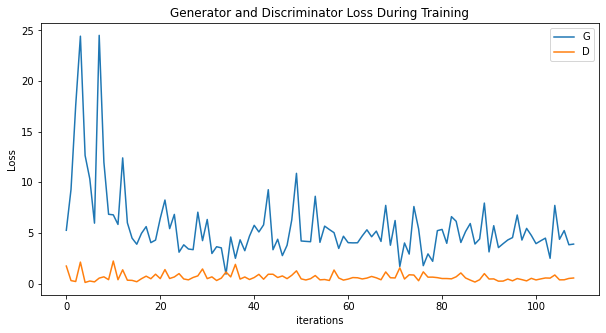

In [15]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

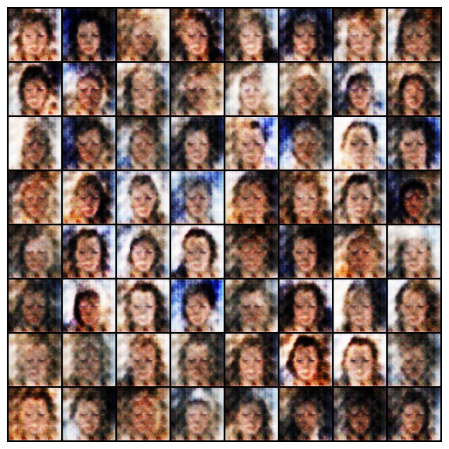

In [17]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())


In [18]:
print(len(img_list))

6


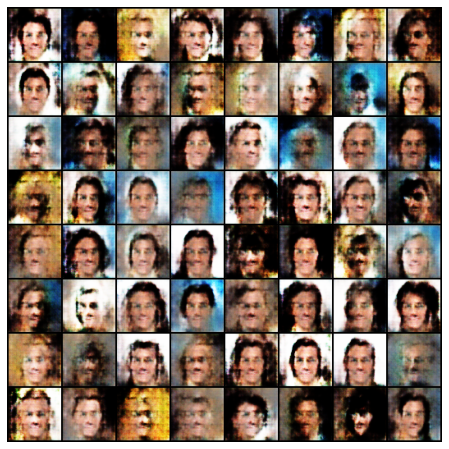

In [19]:
with torch.no_grad():
    fake = netG(fixed_noise).detach().cpu()
img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())
